# AI-Powered Injury Risk Prediction and Performance Management for Football Players

# Installing Required Libraries

In this section, we will install the necessary libraries for data analysis, machine learning, and model interpretationshap


In [3]:
!pip install pandas numpy matplotlib seaborn scikit-learn imbalanced-learn keras joblib shap

# Data Preprocessing and Feature Engineering for Injury Prediction

This notebook demonstrates how to load and preprocess GPS and injury data, merge them based on `PlayerID` and `Date`, handle missing values, and engineer features related to player load and fatigue to assess injury risk.

### 1. Import Libraries
We begin by importing essential libraries (`pandas`, `numpy`, `SimpleImputer`, and others) for data manipulation, imputation, and handling warnings.

### 2. Load Datasets
The GPS and injury datasets are loaded from CSV files using the `pd.read_csv` function.

### 3. Date Handling
Dates in both datasets are converted to `datetime` format to ensure consistent handling.

### 4. Merging Datasets
The GPS and injury datasets are merged on `PlayerID` and `Date`, using a left join to retain all GPS records.

### 5. Handle Missing Data
Missing values in columns like `DaysMissedInjured` are filled with zeros. Numerical and categorical missing values are imputed using the median and most frequent value, respectively.

### 6. Feature Engineering
We create two new features: `WeeklyLoad` and `MonthlyLoad`, which track the player's load over rolling windows of 7 and 30 days.

### 7. Calculate ACWR
The Acute Chronic Workload Ratio (ACWR) is calculated as the ratio of `WeeklyLoad` to `MonthlyLoad` to measure the player's training intensity.

### 8. Fatigue Index and Level
The `FatigueIndex` is derived from ACWR, categorizing players into 'High', 'Moderate', or 'Low' fatigue. A numeric `FatigueLevel` is also assigned based on ACWR values.

### 9. Injury Risk Calculation
A `RiskScore` is calculated based on ACWR, Fatigue Level, and Weekly Load, and players are categorized into injury risk levels ('Low', 'Moderate', 'High') based on quantiles.

### 10. Final Dataset
We filter for key features, including `ACWR`, `FatigueIndex`, `RiskScore`, and `InjuryRisk`, for further analysis or modeling.

This approach enables the tracking and assessment of player fatigue and injury risk, providing valuable insights for injury prevention strategies.


In [5]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
import warnings
from pandas.errors import PerformanceWarning

# Ignore specific warnings
warnings.filterwarnings("ignore", category=UserWarning, module='xgboost')
warnings.filterwarnings("ignore", category=UserWarning, module="pandas")
warnings.filterwarnings("ignore", category=PerformanceWarning, module="pandas")
# Suppress UserWarnings 
warnings.filterwarnings("ignore", category=UserWarning)
# Suppress PerformanceWarnings 
warnings.filterwarnings("ignore", category=PerformanceWarning)



# Load Data
def load_data(gps_path, injury_path):
    gps_data = pd.read_csv(gps_path, encoding='latin1', low_memory=False)
    injury_data = pd.read_csv(injury_path, encoding='latin1', low_memory=False)
    return gps_data, injury_data

# Define paths to datasets
gps_data_path = r"C:\Users\sowjanya\Desktop\Injury Prediction\data\GPS Data Set.csv"
injury_data_path = r"C:\Users\sowjanya\Desktop\Injury Prediction\data\Injury Data Set.csv"

# Load datasets
gps_data, injury_data = load_data(gps_data_path, injury_data_path)

# Parse Dates
gps_data['Date'] = pd.to_datetime(gps_data['Date'], errors='coerce')
injury_data['Date'] = pd.to_datetime(injury_data['Date'], errors='coerce')

# Merge Datasets
merged_data = pd.merge(gps_data, injury_data, on=['PlayerID', 'Date'], how='left', suffixes=('_gps', '_injury'))

# Handle Missing Values
merged_data['DaysMissedInjured'] = merged_data['DaysMissedInjured'].fillna(0)

# Remove Duplicates
merged_data = merged_data.drop_duplicates(subset=['PlayerID', 'Date'], keep='first')

# Impute Missing Values for both Numerical and Categorical Columns
categorical_columns = merged_data.select_dtypes(include=['object']).columns
numerical_columns = merged_data.select_dtypes(include=(['float64', 'int64'])).columns

imputer = SimpleImputer(strategy='median')
merged_data[numerical_columns] = imputer.fit_transform(merged_data[numerical_columns])

imputer = SimpleImputer(strategy='most_frequent')
merged_data[categorical_columns] = imputer.fit_transform(merged_data[categorical_columns])

# Feature Engineering: Weekly Load, Monthly Load, ACWR, FatigueIndex, and RiskScore
def calculate_load(group, window):
    return group.rolling(window=window, min_periods=1).sum()

# Sort by PlayerID and Date to ensure proper calculation of rolling windows
merged_data = merged_data.sort_values(by=['PlayerID', 'Date'])

# Calculate Weekly Load
merged_data['WeeklyLoad'] = merged_data.groupby('PlayerID')['Total Player Load'].transform(lambda x: calculate_load(x, 7))


# Calculate Monthly Load
merged_data['MonthlyLoad'] = merged_data.groupby('PlayerID')['Total Player Load'].transform(lambda x: calculate_load(x, 30))

# Calculate ACWR (Acute:Chronic Workload Ratio) using a more precise division
def calculate_acwr(row):
    acute = row['WeeklyLoad']
    chronic = row['MonthlyLoad'] / 4.3  # Using 4.3 weeks for 30 days
    if chronic == 0:
        return np.nan
    return acute / chronic

merged_data['ACWR'] = merged_data.apply(calculate_acwr, axis=1)

# Calculate FatigueIndex (higher ACWR indicates higher fatigue)
def calculate_fatigue_index(acwr):
    if pd.isna(acwr):
        return np.nan
    elif acwr > 1.5:
        return 'High'   # Detailed Fatigue Index, 'High', 'Moderate', 'Low'
    elif acwr >= 0.8:
        return 'Moderate'
    else:
        return 'Low'

merged_data['FatigueIndex'] = merged_data['ACWR'].apply(calculate_fatigue_index)

#Feature Engineering and Debugging:

# Fatigue Level Calculation (simplified numeric scale)
merged_data['FatigueLevel'] = merged_data['ACWR'].apply(lambda x: 2 if x > 1.5 else (1 if x >= 0.8 else 0))  # 2=High, 1=Moderate, 0=Low

# Add FatigueLevelCategory (categorical) based on numeric FatigueLevel
def fatigue_level_category(fatigue_level):
    if fatigue_level == 2:
        return 'High'
    elif fatigue_level == 1:
        return 'Moderate'
    else:
        return 'Low'

merged_data['FatigueLevelCategory'] = merged_data['FatigueLevel'].apply(fatigue_level_category)

# RiskScore Calculation (based on standard sports science formulas)
# Weighted combination of factors, assuming 30% for ACWR, 20% for FatigueLevel, etc.
merged_data['RiskScore'] = (
    merged_data['ACWR'] * 0.3 +
    merged_data['FatigueLevel'] * 0.2 +  # Using the numeric FatigueLevel
    merged_data['DaysMissedInjured'] * 0.2 +
    merged_data['Player Load Per Minute'] * 0.1 +
    merged_data['ACC + DEC'] * 0.1 +
    merged_data['Sprinting'] * 0.1
)

# Classify InjuryRisk (using quantiles or thresholds based on expert recommendations)
merged_data['InjuryRisk'] = pd.qcut(merged_data['RiskScore'], q=3, labels=['Low Risk', 'Moderate Risk', 'High Risk'])

# Final columns for analysis
key_features = [
    'PlayerID', 'Date', 'ACC + DEC', 'Total Distance', 'Duration (minutes)', 
    'Max Speed (km/h)', 'Sprinting', 'Total Player Load', 'Distance >85% Max Speed', 
    'InjuryStatus', 'DaysMissedInjured', 'InjuryName', 'BodyArea', 'MechanismOfInjury', 
    'RecurrenceOfPreviousInjury', 'WeeklyLoad', 'MonthlyLoad', 'ACWR', 'FatigueIndex', 
    'FatigueLevel', 'FatigueLevelCategory', 'RiskScore', 'InjuryRisk', 'Player Load Per Minute'
]

filtered_data = merged_data[key_features]

# Print intermediate values during training
#print(merged_data[['PlayerID', 'Date', 'ACWR', 'FatigueIndex', 'RiskScore', 'InjuryRisk']].head())

# Output final dataset to CSV
#output_path = r"C:\Users\sowjanya\Desktop\Injury Prediction\data\filtered_injury_risk_data.csv"
#filtered_data.to_csv(output_path, index=False)

# Check the distribution of InjuryRisk values
#print(filtered_data['InjuryRisk'].value_counts())


# Machine Learning Model Training and Evaluation for Injury Risk Prediction

This notebook demonstrates the process of training and evaluating various machine learning models to predict injury risk based on player activity and fatigue datning and evaluation for predicting injury risk in athletes.


## 1. Import Libraries
We begin by importing the necessary libraries for:
- Data manipulation (`pandas`, `numpy`)
- Data preprocessing and encoding (`SimpleImputer`, `LabelEncoder`, `train_test_split`)
- Model training and evaluation (`RandomForestClassifier`, `GradientBoostingClassifier`, `XGBClassifier`, `ExtraTreesClassifier`)
- Metrics and visualization (`classification_report`, `accuracy_score`, `confusion_matrix`, `roc_curve`, `shap`, `matplotlib`, `seaborn`).

In [8]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_curve, auc
import joblib
import os
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import ExtraTreesClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import label_binarize



## 2. Loading the Dataset

The dataset `filtered_injury_risk_data.csv` is loaded into a DataFrame using `pandas.read_csv()`. We then:
- Display the first few rows of data with `.head()`.
- Show dataset info (column names, types, non-null counts) using `.info()`.
- Display statistical summary of numerical columns with `.describe()`.


In [10]:
# Step 2: Load the dataset
filtered_data_path = r"C:\Users\sowjanya\Desktop\Injury Prediction\data\filtered_injury_risk_data.csv"
df = pd.read_csv(filtered_data_path)

# Step 2: Data Preprocessing
# Display the first few rows of the dataset
display(df.head())
# Display dataset information (data types and non-null counts)
display(df.info())
# Display statistical summary of numerical columns
display(df.describe())

,PlayerID,Date,ACC + DEC,Total Distance,Duration (minutes),Max Speed (km/h),Sprinting,Total Player Load,Distance >85% Max Speed,InjuryStatus,...,RecurrenceOfPreviousInjury,WeeklyLoad,MonthlyLoad,ACWR,FatigueIndex,FatigueLevel,FatigueLevelCategory,RiskScore,InjuryRisk,Player Load Per Minute
0,1.0,2023-01-25,0.0,3881.0,32.6,17.30000,0.0,240.0,0.0,Available,...,No,240.0,240.0,4.3,High,2,High,2.441933,Moderate Risk,7.51933
1,1.0,2023-01-27,8.0,4913.0,32.6,20.10000,0.0,240.0,0.0,Available,...,No,480.0,480.0,4.3,High,2,High,3.241933,Moderate Risk,7.51933
2,1.0,2023-01-30,21.0,4651.0,32.6,26.10000,24.0,240.0,0.0,Available,...,No,720.0,720.0,4.3,High,2,High,6.941933,High Risk,7.51933
3,1.0,2023-01-31,86.0,4213.0,32.6,29.20000,134.0,240.0,0.0,Available,...,No,960.0,960.0,4.3,High,2,High,24.441933,High Risk,7.51933
4,1.0,2023-02-02,3.0,3683.0,43.5,27.37464,40.0,401.0,0.0,Available,...,No,1361.0,1361.0,4.3,High,2,High,6.911693,High Risk,9.21693


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19981 entries, 0 to 19980
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   PlayerID                    19981 non-null  float64
 1   Date                        19981 non-null  object 
 2   ACC + DEC                   19981 non-null  float64
 3   Total Distance              19981 non-null  float64
 4   Duration (minutes)          19981 non-null  float64
 5   Max Speed (km/h)            19981 non-null  float64
 6   Sprinting                   19981 non-null  float64
 7   Total Player Load           19981 non-null  float64
 8   Distance >85% Max Speed     19981 non-null  float64
 9   InjuryStatus                19981 non-null  object 
 10  DaysMissedInjured           19981 non-null  float64
 11  InjuryName                  19981 non-null  object 
 12  BodyArea                    19981 non-null  object 
 13  MechanismOfInjury           199

None

,PlayerID,ACC + DEC,Total Distance,Duration (minutes),Max Speed (km/h),Sprinting,Total Player Load,Distance >85% Max Speed,DaysMissedInjured,WeeklyLoad,MonthlyLoad,ACWR,FatigueLevel,RiskScore,Player Load Per Minute
count,19981.000000,19981.000000,19981.000000,19981.000000,19981.000000,19981.000000,19981.000000,19981.000000,19981.000000,19981.000000,19981.000000,19942.000000,19981.000000,19942.000000,19981.000000
mean,70.417046,18.872879,2808.301762,40.196151,23.078405,24.165958,291.237976,4.469083,0.240178,1997.696812,7998.120114,1.263731,0.948851,5.680704,7.731193
std,44.320580,20.364567,2222.337779,29.497076,5.601298,54.362556,224.045793,17.477908,5.031504,824.006388,3053.467870,0.837461,0.610048,6.815649,2.738529
min,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.165004,0.000000,0.101563,0.000000
25%,30.000000,4.000000,930.000000,13.500000,20.089340,0.000000,103.000000,0.000000,0.000000,1386.000000,6011.000000,0.838792,1.000000,1.744568,6.020000
50%,65.000000,12.000000,2271.500000,32.600000,23.702210,0.000000,240.000000,0.000000,0.000000,1956.000000,8177.000000,1.044123,1.000000,2.996439,7.519330
75%,110.000000,28.000000,4266.000000,61.300000,26.786370,18.000000,442.000000,0.000000,0.000000,2543.000000,10190.000000,1.301803,1.000000,6.550517,9.250000
max,152.000000,288.000000,14883.000000,262.200000,36.253170,562.000000,1783.000000,413.840000,365.000000,5400.000000,16942.000000,4.300000,2.000000,77.151101,29.660000


## 3. Data Visualization

Visualizing data helps understand the distribution and relationships in the dataset:
- **Missing Data**: A heatmap is plotted to visualize missing values.
- **Target Variable Distribution**: A count plot shows the distribution of the `InjuryRisk` target variable.
- **Correlation Matrix**: A heatmap displays the correlation between numerical features.
- **Box Plots**: Box plots for `Total Distance` and `Max Speed (km/h)` by injury risk.
- **Histograms**: Distribution of `Total Distance` and `Max Speed (km/h)` values.
- **Pair Plot**: Pairwise scatter plots of features colored by `InjuryRisk` to visualize relationships.


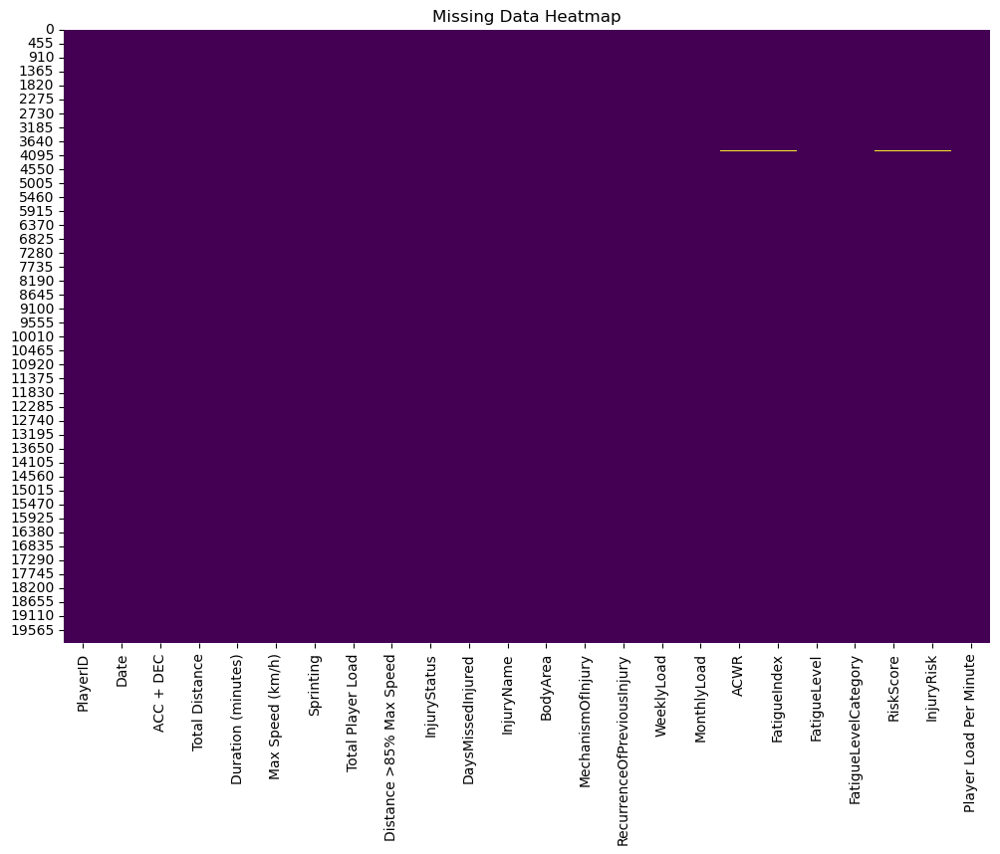

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot heatmap of missing data
plt.figure(figsize=(12, 8))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Data Heatmap')
plt.show()


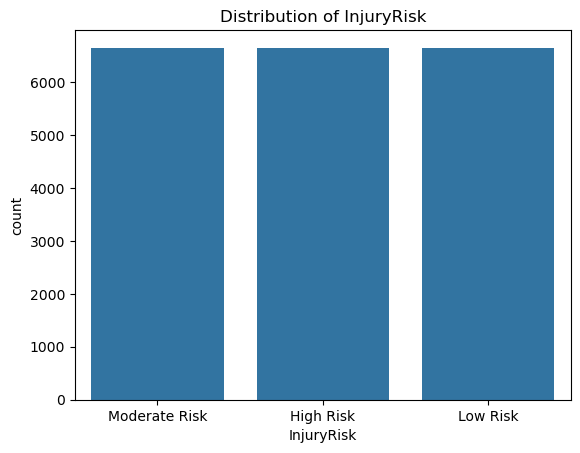

In [13]:
# Distribution of target variable
sns.countplot(x='InjuryRisk', data=df)
plt.title('Distribution of InjuryRisk')
plt.show()


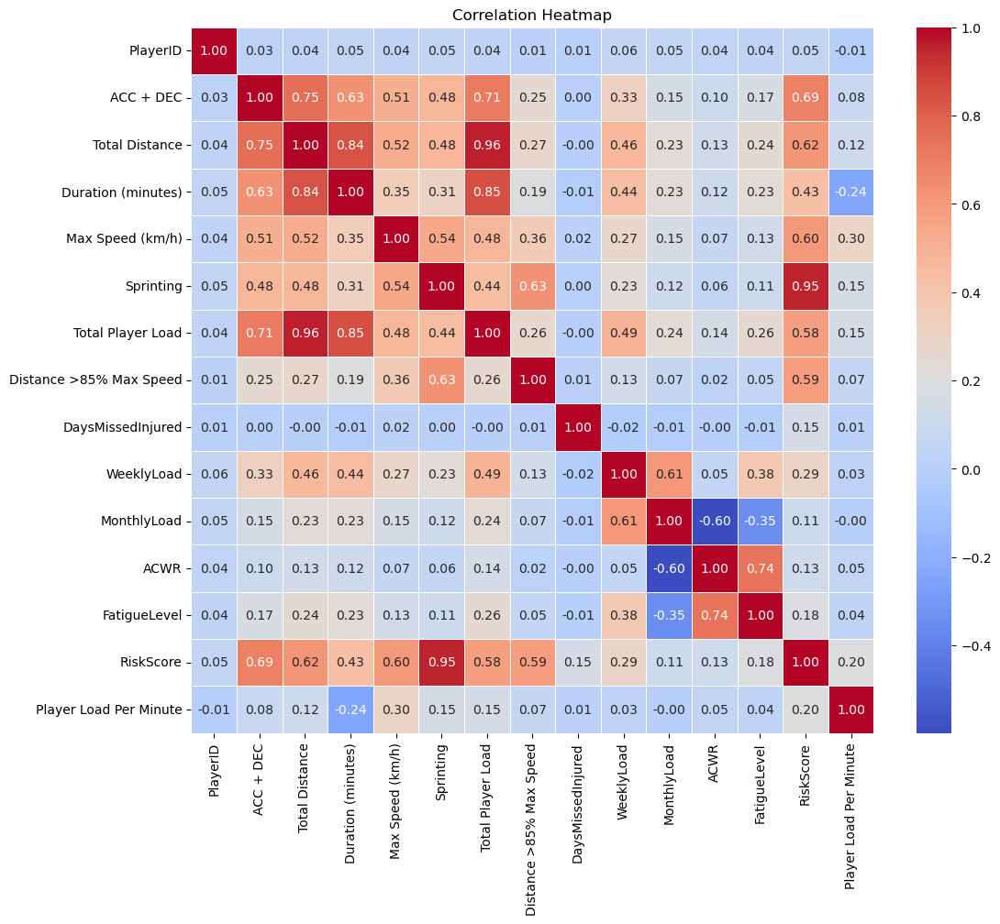

In [14]:
# Correlation Matrix for numerical features
numeric_df = df.select_dtypes(include=['float64', 'int64'])
corr_matrix = numeric_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


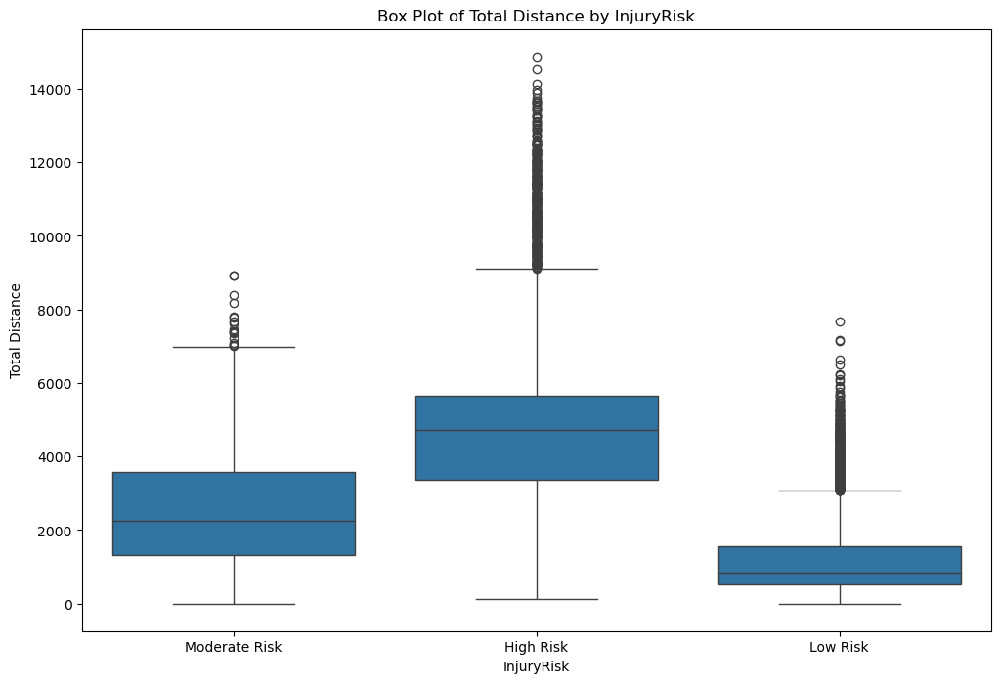

In [15]:
# Box plot for the feature 'Total Distance' by Injury Risk
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='InjuryRisk', y='Total Distance')
plt.title('Box Plot of Total Distance by InjuryRisk')
plt.show()

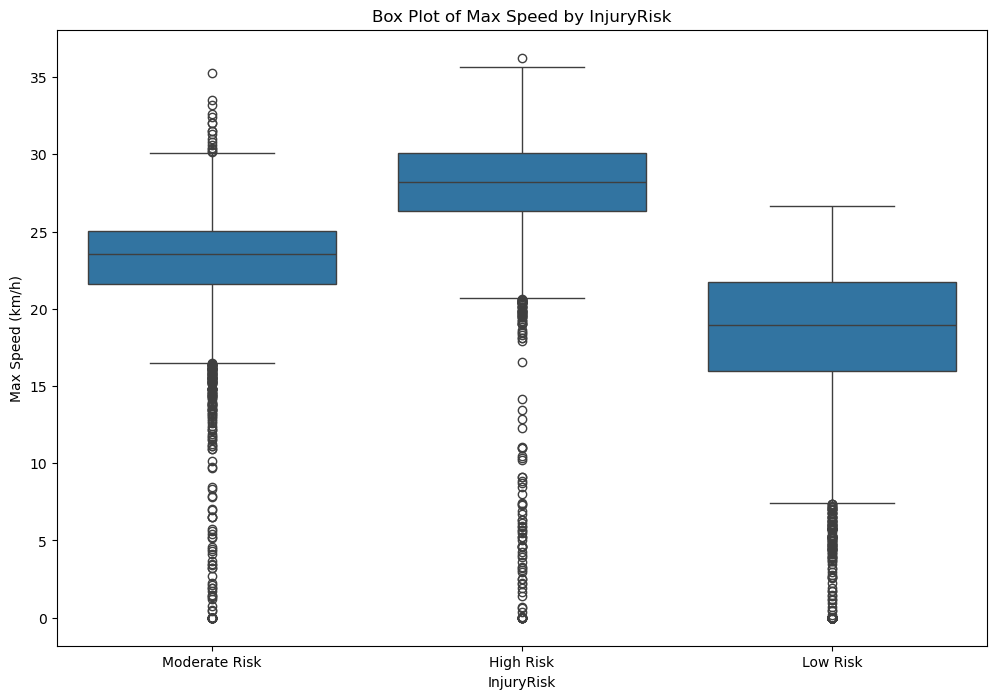

In [16]:
# Box plot for the feature 'Max Speed (km/h)' by Injury Risk
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, x='InjuryRisk', y='Max Speed (km/h)')
plt.title('Box Plot of Max Speed by InjuryRisk')
plt.show()

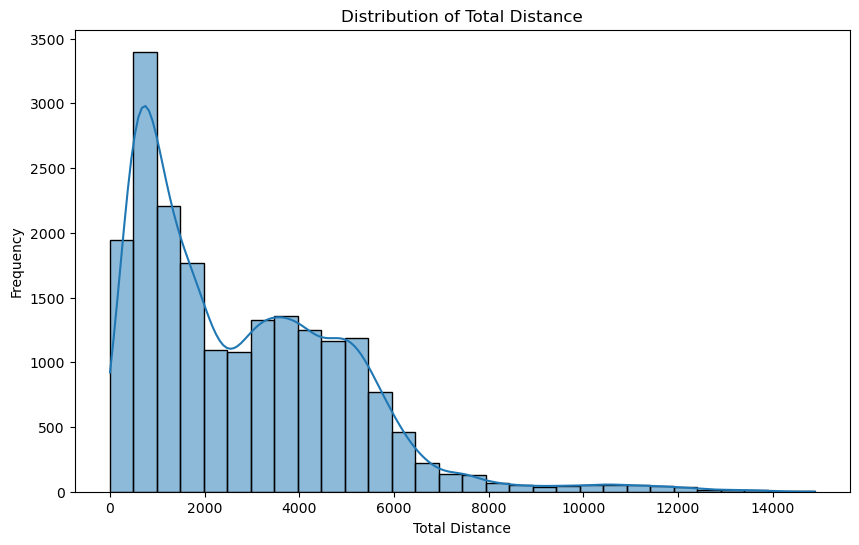

In [17]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Total Distance'], kde=True, bins=30)
plt.title('Distribution of Total Distance')
plt.xlabel('Total Distance')
plt.ylabel('Frequency')
plt.show()


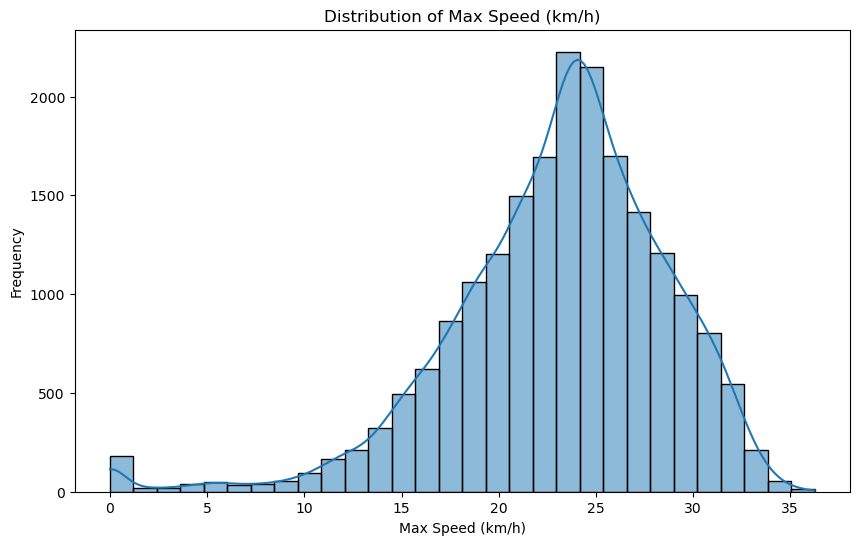

In [18]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Max Speed (km/h)'], kde=True, bins=30)
plt.title('Distribution of Max Speed (km/h)')
plt.xlabel('Max Speed (km/h)')
plt.ylabel('Frequency')
plt.show()


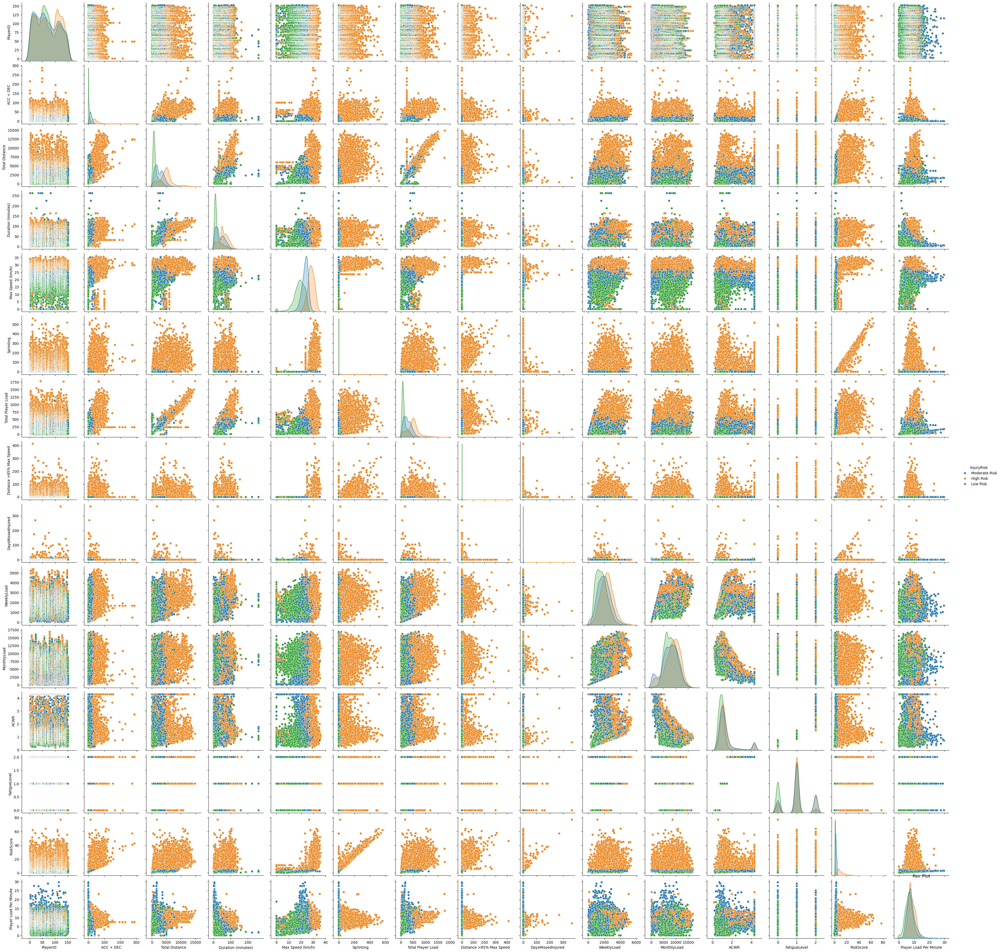

In [19]:
# Pair Plot
sns.pairplot(df, hue='InjuryRisk', diag_kind='kde')
plt.title('Pair Plot')
plt.show()

## 4 Data Preprocessing (Imputation & Encoding)

To prepare the data:
- **Imputation**: Missing values in numerical columns are imputed using the median, and categorical columns with the most frequent value.
- **Label Encoding**: The categorical columns `FatigueIndex` and `FatigueLevelCategory` are encoded to numeric values using `LabelEncoder()`.


In [21]:

from sklearn.preprocessing import LabelEncoder

# Step 4: Data Preprocessing (Imputation and Encoding)
# Get categorical and numerical columns
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Impute missing values for numerical columns
imputer = SimpleImputer(strategy='median')
df.loc[:, numerical_columns] = imputer.fit_transform(df[numerical_columns])

# Impute missing values for categorical columns
imputer_cat = SimpleImputer(strategy='most_frequent')
df.loc[:, categorical_columns] = imputer_cat.fit_transform(df[categorical_columns])

# Label Encoding for 'FatigueIndex' column
label_encoder = LabelEncoder()
df.loc[:, 'FatigueIndex'] = label_encoder.fit_transform(df['FatigueIndex'])

# Label Encoding for 'FatigueLevelCategory' column
fatigue_level_encoder = LabelEncoder()
df.loc[:, 'FatigueLevelCategory'] = fatigue_level_encoder.fit_transform(df['FatigueLevelCategory'])


## 5. Feature Selection & Target Definition

We define the features (X) and target variable (y):
- **Features (X)**: Includes variables like `Total Distance`, `Max Speed (km/h)`, `FatigueIndex`, `ACWR`, etc.
- **Target (y)**: The target variable `InjuryRisk`, encoded as a numeric value using `pd.factorize()`.


In [23]:
# Step 5: Define Features (X) and Target (y)
X = df[['ACC + DEC', 'Total Distance', 'Duration (minutes)', 'Max Speed (km/h)', 
        'Total Player Load', 'Distance >85% Max Speed', 'DaysMissedInjured', 
        'WeeklyLoad', 'MonthlyLoad', 'ACWR', 'FatigueIndex', 'FatigueLevelCategory']]  # Features

y = df['InjuryRisk']  # Target variable
y = pd.factorize(y)[0]  # Encode target variable if it's categorical


## 6. Train-Test Split

The dataset is split into training and testing sets:
- 80% for training and 20% for testing using `train_test_split()`.
- Ensures both sets have the same features using `X_train.align(X_test)`.


In [25]:
# Import necessary libraries
from sklearn.model_selection import train_test_split

# Step 6: Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ensure that both X_train and X_test have the same columns and order
X_train, X_test = X_train.align(X_test, join='inner', axis=1)  # Align columns to have the same features in X_train and X_test


## 7 Feature Scaling

The features are scaled to normalize their range using `StandardScaler()`:
- Fit the scaler on training data and transform both training and test data.


In [27]:
import os

# Step 7:Scale the Features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize a directory to save models
model_dir = r"C:\Users\sowjanya\Desktop\Injury Prediction\models"
os.makedirs(model_dir, exist_ok=True)

# Function to train, evaluate, save a model, and generate plots
def train_and_evaluate_model(model, model_name):
    print(f"\nTraining {model_name}...")
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    classification_rep = classification_report(y_test, y_pred)
    confusion_mat = confusion_matrix(y_test, y_pred)

    # Print evaluation metrics
    print(f"{model_name} Accuracy: {accuracy}")
    print(f"{model_name} Classification Report:\n{classification_rep}")
    print(f"{model_name} Confusion Matrix:\n{confusion_mat}")

    # Save the model to disk
    model_filename = os.path.join(model_dir, f"{model_name.lower().replace(' ', '_')}_model.joblib")
    joblib.dump(model, model_filename)
    print(f"{model_name} model saved at: {model_filename}")

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y), yticklabels=np.unique(y))
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    # Calculate ROC Curve
    y_test_bin = label_binarize(y_test, classes=np.unique(y))
    y_pred_prob = model.predict_proba(X_test_scaled)
    n_classes = y_test_bin.shape[1]
    fpr, tpr, roc_auc = {}, {}, {}

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name}')
    plt.legend(loc="lower right")
    plt.show()

    return accuracy

## 8 Model Training and Evaluation

We train four models and evaluate their performance:
- **Models**: Random Forest, Gradient Boosting, Extra Trees, and XGBoost.
- **Evaluation**: For each model, we calculate:
  - Accuracy, classification report, and confusion matrix.
  - ROC curve to evaluate model performance.
  - Confusion matrix is visualized using a heatmap.
- The trained models are saved using `joblib.dump()`.



Training Random Forest...
Random Forest Accuracy: 0.939704778583938
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.90      0.91      1312
           1       0.95      0.95      0.95      1363
           2       0.96      0.96      0.96      1322

    accuracy                           0.94      3997
   macro avg       0.94      0.94      0.94      3997
weighted avg       0.94      0.94      0.94      3997

Random Forest Confusion Matrix:
[[1186   67   59]
 [  62 1301    0]
 [  53    0 1269]]
Random Forest model saved at: C:\Users\sowjanya\Desktop\Injury Prediction\models\random_forest_model.joblib


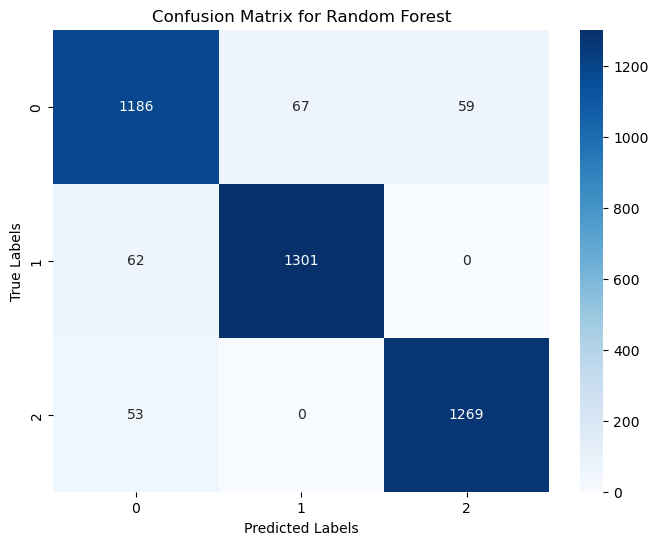

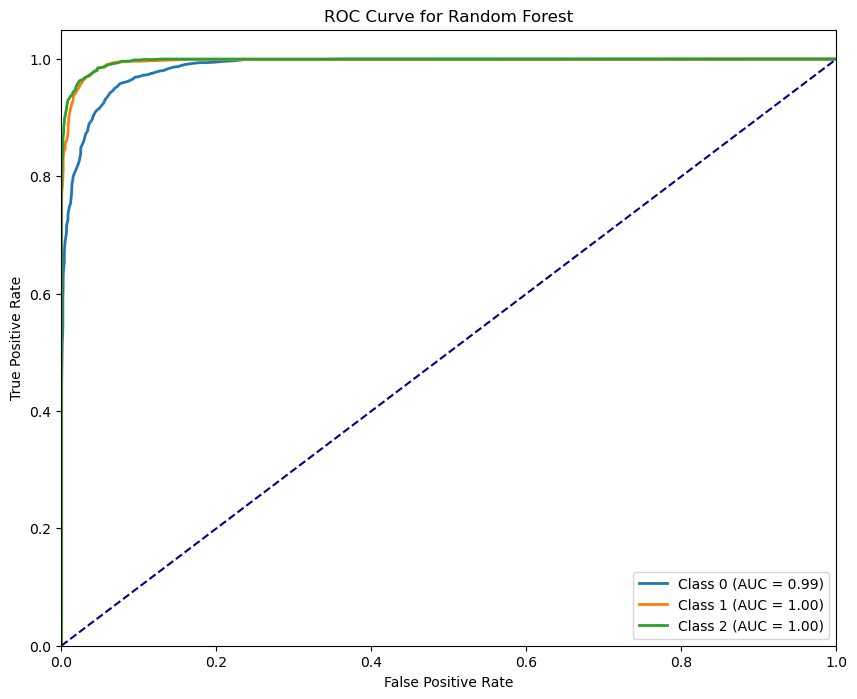

In [29]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.ensemble import ExtraTreesClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_curve, auc
import joblib
# Train and evaluate models
model_accuracies = {}
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
model_accuracies["Random Forest"] = train_and_evaluate_model(rf_model, "Random Forest")



Training Gradient Boosting...
Gradient Boosting Accuracy: 0.9409557167875907
Gradient Boosting Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      1312
           1       0.95      0.96      0.95      1363
           2       0.95      0.97      0.96      1322

    accuracy                           0.94      3997
   macro avg       0.94      0.94      0.94      3997
weighted avg       0.94      0.94      0.94      3997

Gradient Boosting Confusion Matrix:
[[1179   65   68]
 [  60 1303    0]
 [  43    0 1279]]
Gradient Boosting model saved at: C:\Users\sowjanya\Desktop\Injury Prediction\models\gradient_boosting_model.joblib


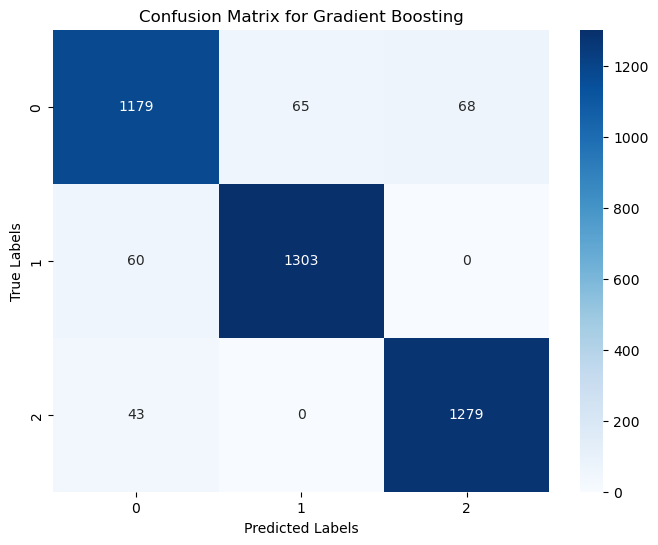

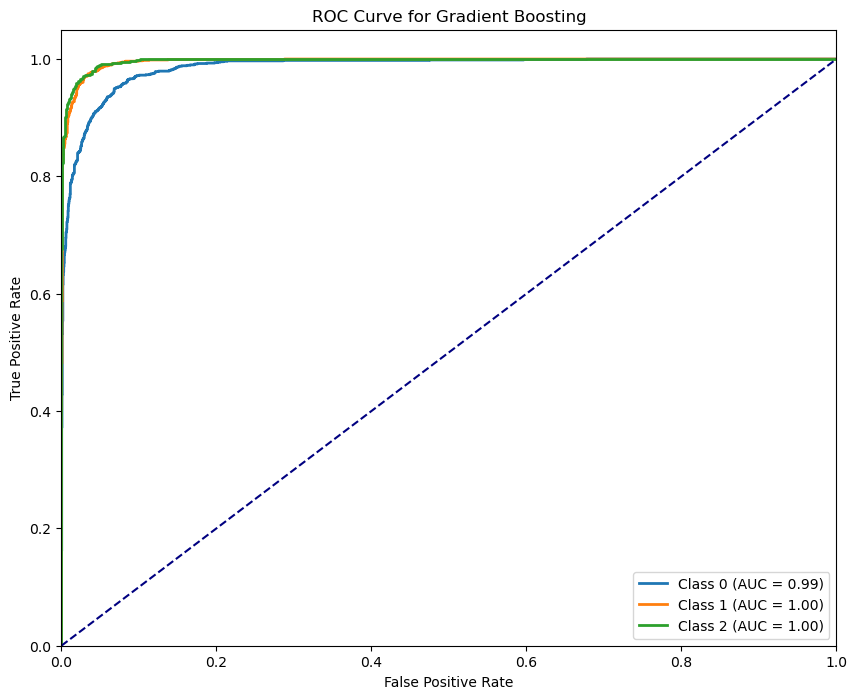

In [30]:
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
model_accuracies["Gradient Boosting"] = train_and_evaluate_model(gb_model, "Gradient Boosting")


Training Extra Trees...
Extra Trees Accuracy: 0.9337002752064048
Extra Trees Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90      1312
           1       0.96      0.94      0.95      1363
           2       0.95      0.96      0.95      1322

    accuracy                           0.93      3997
   macro avg       0.93      0.93      0.93      3997
weighted avg       0.93      0.93      0.93      3997

Extra Trees Confusion Matrix:
[[1185   55   72]
 [  83 1280    0]
 [  55    0 1267]]
Extra Trees model saved at: C:\Users\sowjanya\Desktop\Injury Prediction\models\extra_trees_model.joblib


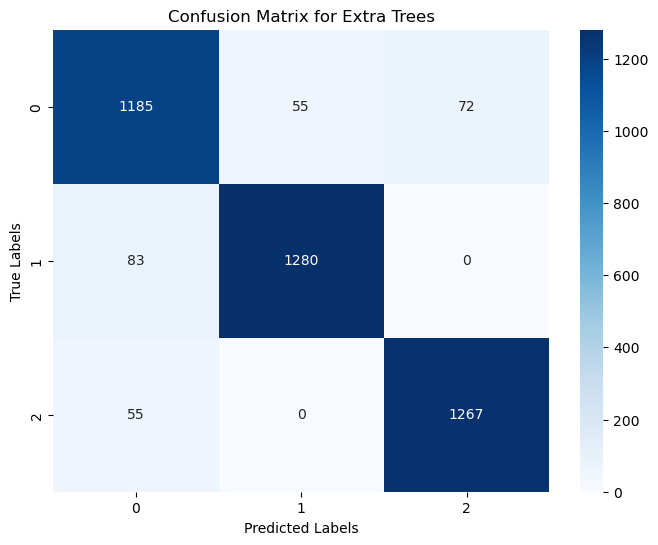

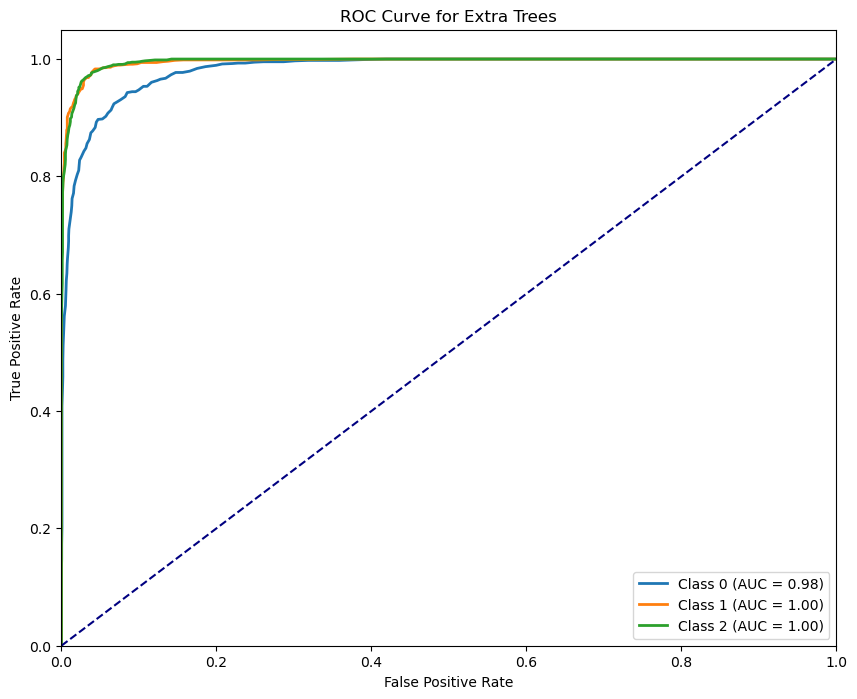

In [31]:
et_model = ExtraTreesClassifier(n_estimators=100, random_state=42)
model_accuracies["Extra Trees"] = train_and_evaluate_model(et_model, "Extra Trees")


Training XGBoost...
XGBoost Accuracy: 0.9484613460095072
XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.92      0.92      1312
           1       0.95      0.96      0.96      1363
           2       0.96      0.97      0.97      1322

    accuracy                           0.95      3997
   macro avg       0.95      0.95      0.95      3997
weighted avg       0.95      0.95      0.95      3997

XGBoost Confusion Matrix:
[[1202   62   48]
 [  59 1304    0]
 [  37    0 1285]]
XGBoost model saved at: C:\Users\sowjanya\Desktop\Injury Prediction\models\xgboost_model.joblib


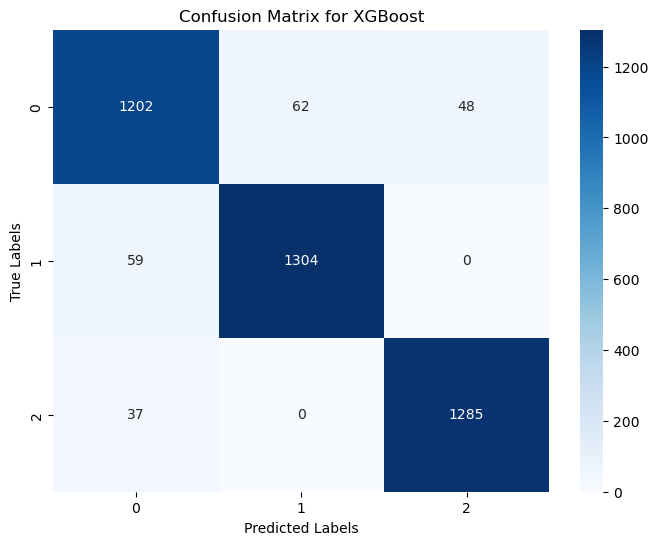

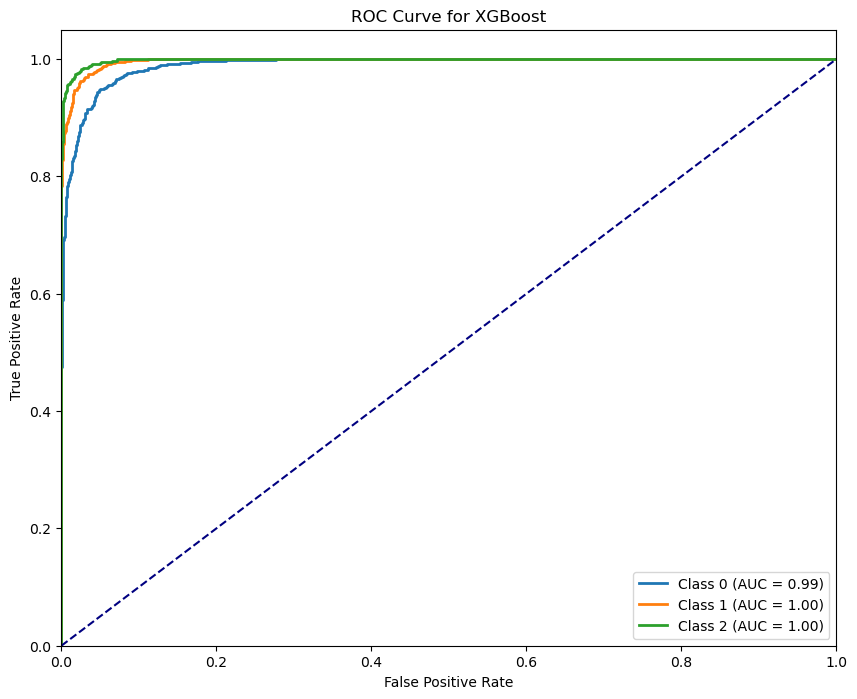

In [32]:
xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.1, use_label_encoder=False, eval_metric='logloss', random_state=42)
model_accuracies["XGBoost"] = train_and_evaluate_model(xgb_model, "XGBoost")

## Step:9 Injury Risk Prediction Model Evaluation and Comparison

In this notebook, we evaluate and compare several machine learning models for predicting injury risk based on various features related to athlete fatigue and performance. The following steps are performed:e1.

2. **Data Preprocessing**: 
   - Missing values are imputed using median for numerical columns and the most frequent value for categorical columns.
   - The target variable `FatigueIndex` and `FatigueLevelCategory` are encoded using `LabelEncoder` for machine learning compatibility.
   - The data is then scaled using `StandardScaler` to ensure that all features are on the same scale before training 2odels.

3. **Model Training and Evaluation**: 
   - Four different models are trained and evaluated: **Random Forest**, **Gradient Boosting**, **Extra Trees**, and **XGBoost**.
   - Performance metrics such as accuracy, ROC AUC, precision, recall, and F1-score for both classes are calculated.
   - Each model is saved to disk after training for3future use.

4. **Model Comparison**:
   - A comparison of all models is plotted using bar charts, which display the accuracy, precision, recall, and F1-score for each model.
   - The best model is identified based on accuracy and4ROC AUC scores.

5. **Model Persistence**: 
   - The trained models, as well as the `scaler` and label encoders, are saved to disk for future predictions.

This comprehensive analysis allows for identifying the most accurate model for predicting injury risk, which can be used for further research or real-world applications.


,Model,Accuracy,ROC AUC,Precision (Class 0),Recall (Class 0),F1-Score (Class 0),Precision (Class 1),Recall (Class 1),F1-Score (Class 1)
0,Random Forest,0.939705,0.993259,0.911606,0.903963,0.907769,0.951023,0.954512,0.952765
1,Gradient Boosting,0.940956,0.993052,0.919657,0.898628,0.909021,0.952485,0.955979,0.954229
2,Extra Trees,0.933700,0.991096,0.895692,0.903201,0.899431,0.958801,0.939105,0.948851
3,XGBoost,0.948461,0.995039,0.926040,0.916159,0.921073,0.954612,0.956713,0.955661


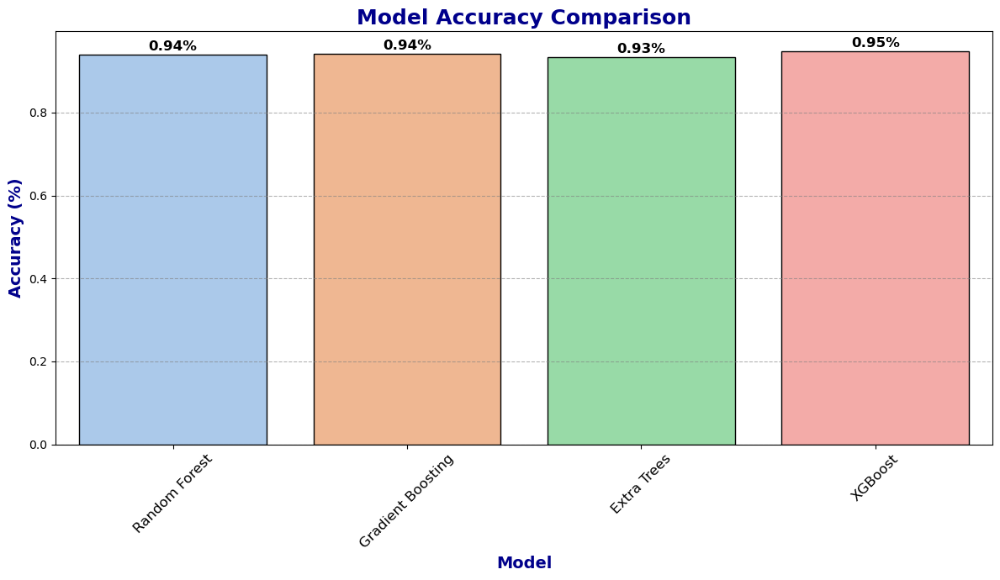

The best model based on Accuracy is: XGBoost with an accuracy of 0.95


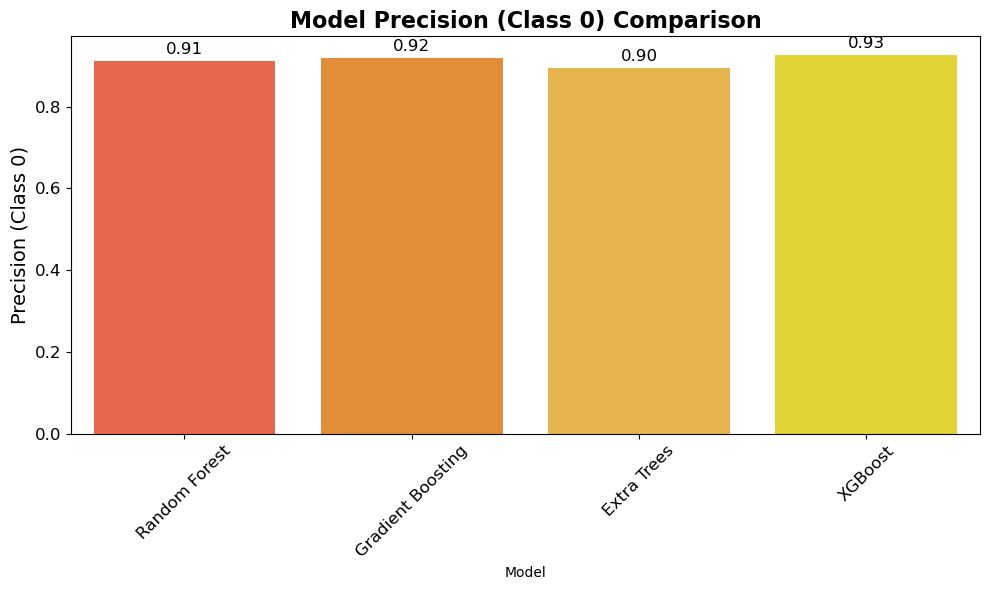

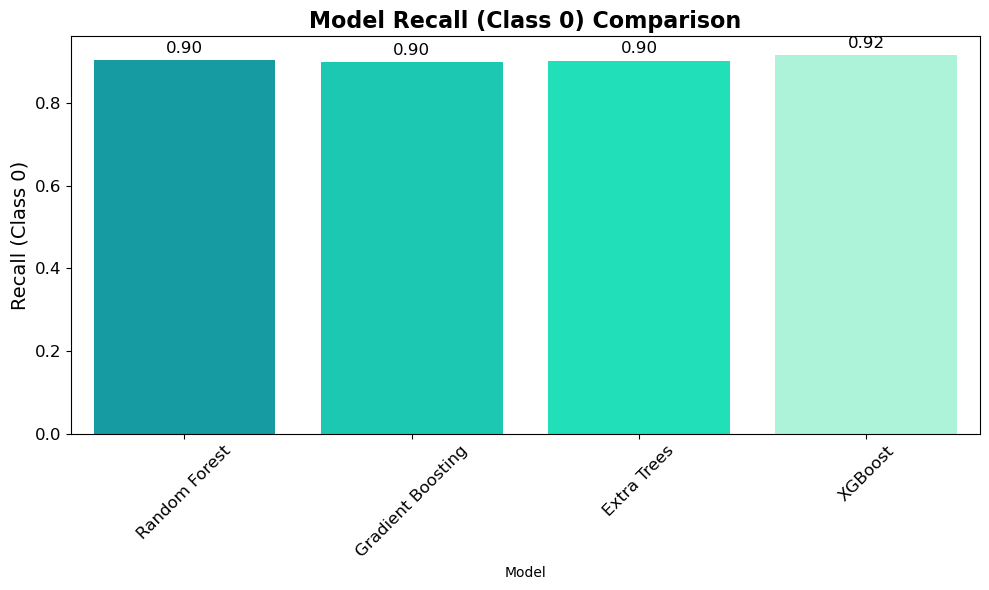

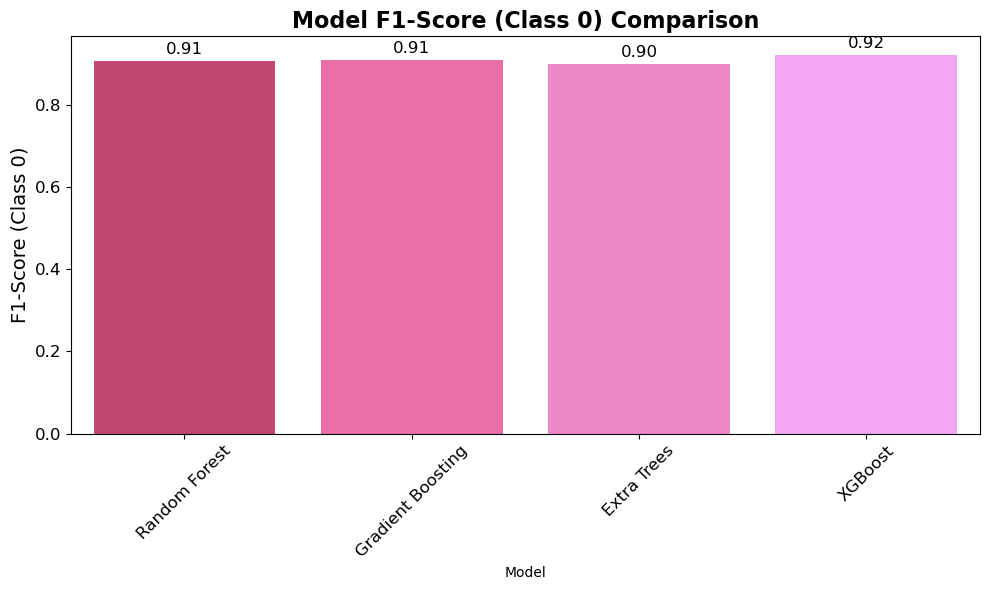

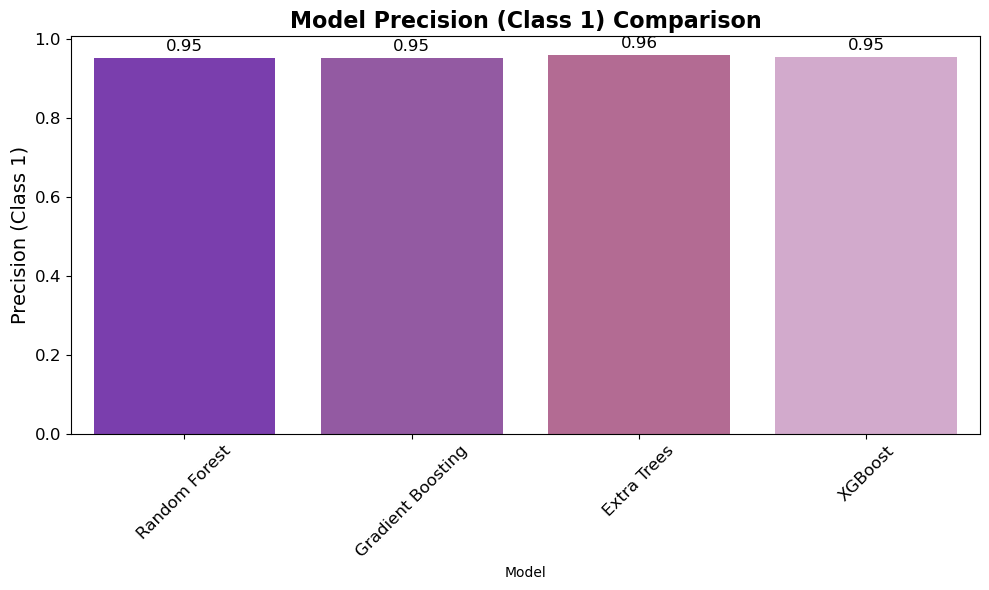

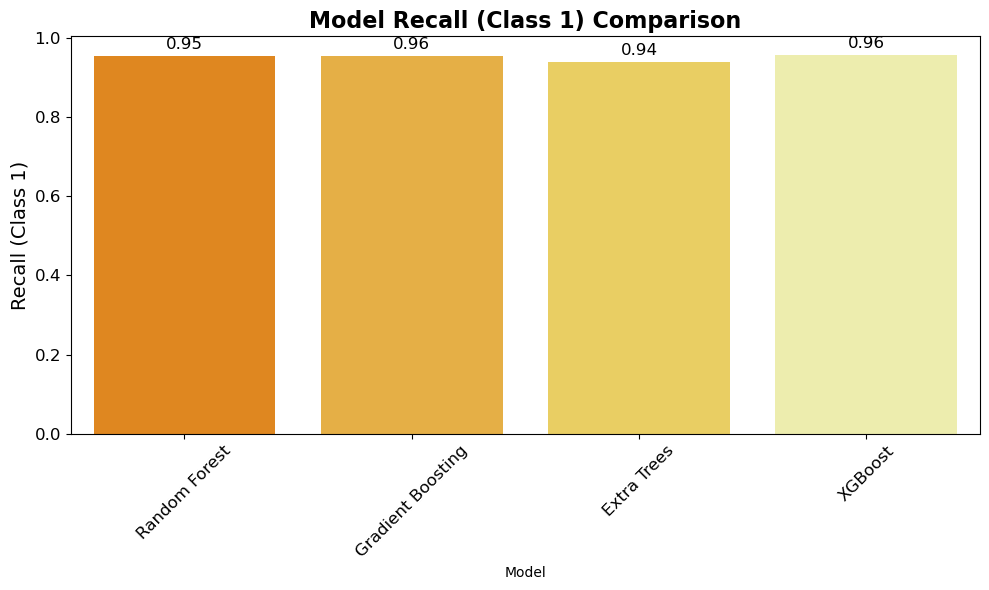

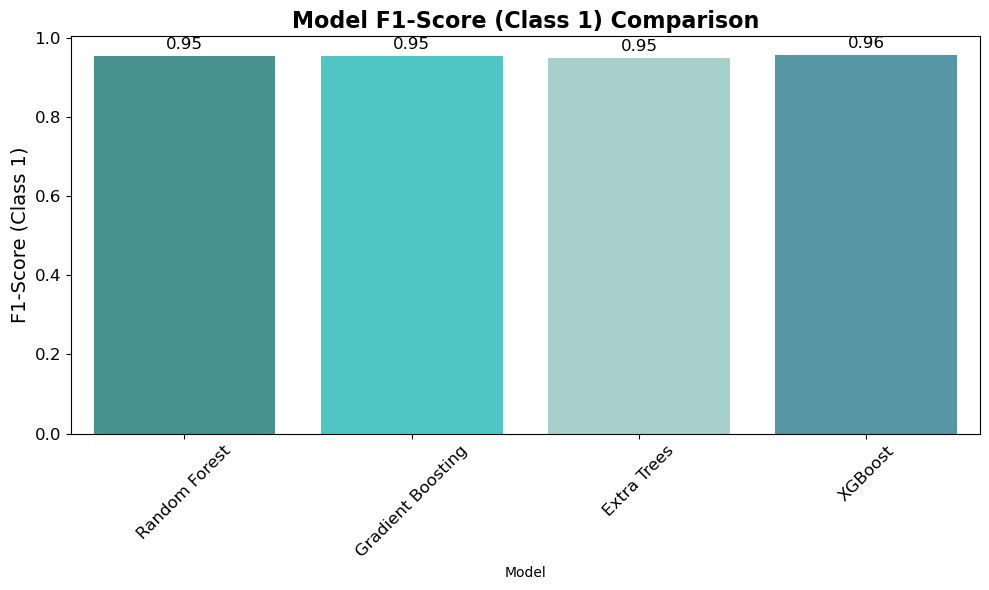

In [42]:
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix

import warnings

# Suppress FutureWarnings specifically
warnings.filterwarnings("ignore", category=FutureWarning)
# Data Preprocessing
def preprocess_data(df):
    categorical_columns = df.select_dtypes(include=['object']).columns
    numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

    # Impute missing values
    imputer = SimpleImputer(strategy='median')
    df[numerical_columns] = imputer.fit_transform(df[numerical_columns])

    imputer_cat = SimpleImputer(strategy='most_frequent')
    df[categorical_columns] = imputer_cat.fit_transform(df[categorical_columns])

    # Label Encoding
    label_encoder = LabelEncoder()
    df['FatigueIndex'] = label_encoder.fit_transform(df['FatigueIndex'])

    fatigue_level_encoder = LabelEncoder()
    df['FatigueLevelCategory'] = fatigue_level_encoder.fit_transform(df['FatigueLevelCategory'])

    return df, fatigue_level_encoder

# Model training and evaluation
def train_and_evaluate_model(model, model_name, X_train_scaled, X_test_scaled, y_train, y_test):
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test_scaled), multi_class='ovr', average='weighted')
    classification_rep = classification_report(y_test, y_pred, output_dict=True)
    confusion_mat = confusion_matrix(y_test, y_pred)

    # Save the model to disk
    model_filename = os.path.join(model_dir, f"{model_name.lower().replace(' ', '_')}_model.joblib")
    joblib.dump(model, model_filename)

    return accuracy, roc_auc, classification_rep, confusion_mat

def evaluate_models(models, X_train_scaled, X_test_scaled, y_train, y_test):
    model_comparison = []
    for model_name, model in models.items():
        accuracy, roc_auc, classification_rep, confusion_mat = train_and_evaluate_model(
            model, model_name, X_train_scaled, X_test_scaled, y_train, y_test)
        model_comparison.append({
            "Model": model_name,
            "Accuracy": accuracy,
            "ROC AUC": roc_auc,
            "Precision (Class 0)": classification_rep['0']['precision'],
            "Recall (Class 0)": classification_rep['0']['recall'],
            "F1-Score (Class 0)": classification_rep['0']['f1-score'],
            "Precision (Class 1)": classification_rep['1']['precision'],
            "Recall (Class 1)": classification_rep['1']['recall'],
            "F1-Score (Class 1)": classification_rep['1']['f1-score']
        })
    return pd.DataFrame(model_comparison)

# Prepare Data for Modeling
df, fatigue_level_encoder = preprocess_data(df)

X = df[['ACC + DEC', 'Total Distance', 'Duration (minutes)', 'Max Speed (km/h)', 'Total Player Load', 
        'Distance >85% Max Speed', 'DaysMissedInjured', 'WeeklyLoad', 'MonthlyLoad', 'ACWR', 'FatigueIndex', 
        'FatigueLevelCategory']]
y = df['InjuryRisk']
y = pd.factorize(y)[0]  # Encode target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_test = X_train.align(X_test, join='inner', axis=1)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize models
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=100, learning_rate=0.1, use_label_encoder=False, eval_metric='logloss', random_state=42)
}

# Evaluate models and compare
comparison_df = evaluate_models(models, X_train_scaled, X_test_scaled, y_train, y_test)

# Display model comparison
display(comparison_df)

# Plot the comparison bar chart for Accuracy
plt.figure(figsize=(12, 7))
sns.barplot(
    x="Model",
    y="Accuracy",
    data=comparison_df,
    palette="pastel",  # Use pastel colors for a soft appearance
    edgecolor="black"
)
plt.title("Model Accuracy Comparison", fontsize=18, fontweight='bold', color="darkblue")
plt.ylabel("Accuracy (%)", fontsize=14, fontweight='bold', color="darkblue")
plt.xlabel("Model", fontsize=14, fontweight='bold', color="darkblue")
plt.xticks(rotation=45, fontsize=12)

# Add percentage labels above each bar
for p in plt.gca().patches:
    height = p.get_height()
    plt.text(
        p.get_x() + p.get_width() / 2,  # Center text on each bar
        height + 0.01,                  # Position slightly above the bar
        f"{height:.2f}%",               # Format as percentage
        ha="center",
        fontsize=12,
        fontweight="bold",
        color="black"
    )

# Adjust layout and display
plt.grid(axis="y", linestyle="--", alpha=0.6, color="gray")
plt.tight_layout()
plt.show()

# Determine best model based on Accuracy and ROC AUC
best_accuracy_model_name = comparison_df.loc[comparison_df['Accuracy'].idxmax(), 'Model']
best_accuracy = comparison_df['Accuracy'].max()
best_roc_auc_model_name = comparison_df.loc[comparison_df['ROC AUC'].idxmax(), 'Model']
best_roc_auc = comparison_df['ROC AUC'].max()

print(f"The best model based on Accuracy is: {best_accuracy_model_name} with an accuracy of {best_accuracy:.2f}")

# Bar Chart: Precision, Recall, F1-Score for Class 0 and Class 1
metrics = ["Precision (Class 0)", "Recall (Class 0)", "F1-Score (Class 0)", 
           "Precision (Class 1)", "Recall (Class 1)", "F1-Score (Class 1)"]

# Define custom attractive color palettes for each chart
color_palettes = {
    "Precision (Class 0)": ["#FF5733", "#FF8D1A", "#FFBD33", "#FFEA1A"],  # Warm tones for precision (Class 0)
    "Recall (Class 0)": ["#00B0B9", "#00E5C7", "#00FFCC", "#A1FFDC"],  # Cool tones for recall (Class 0)
    "F1-Score (Class 0)": ["#D83367", "#FF59A5", "#FF77CC", "#FF99FF"],  # Pink and purple tones for F1-Score (Class 0)
    "Precision (Class 1)": ["#7B2CBF", "#9A4EAE", "#BF5F94", "#D9A3D1"],  # Purple tones for precision (Class 1)
    "Recall (Class 1)": ["#FF8A00", "#FFB82C", "#FFDB4D", "#F7F7A4"],  # Yellow and orange tones for recall (Class 1)
    "F1-Score (Class 1)": ["#3B9E9B", "#3BD9D9", "#A0D7D2", "#4A9EB2"]   # Teal tones for F1-Score (Class 1)
}

for metric in metrics:
    plt.figure(figsize=(10, 6))
    
    # Use custom attractive color palette for each metric
    ax = sns.barplot(x="Model", y=metric, data=comparison_df, palette=color_palettes[metric])
    
    plt.title(f"Model {metric} Comparison", fontsize=16, fontweight='bold')
    plt.ylabel(metric, fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)

    # Adding values to the bars with a contrasting color for better visibility
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 0.01, 
                f'{p.get_height():.2f}', ha='center', va='bottom', fontsize=12, color='black')

    plt.tight_layout()
    plt.show()

## 10. Model Saving

The trained models and components (scaler and label encoders) are saved using `joblib.dump()` for future use:
- Models are saved to a specified directory for later use in predictions or deployment.


In [43]:
# Save the scaler to disk
scaler_filename = os.path.join(model_dir, "scaler.joblib")
joblib.dump(scaler, scaler_filename)
print(f"Scaler saved at: {scaler_filename}")

Scaler saved at: C:\Users\sowjanya\Desktop\Injury Prediction\models\scaler.joblib


In [44]:
# Save the fatigue level encoder to disk
fatigue_level_encoder_filename = os.path.join(model_dir, "fatigue_level_category_label_encoder.joblib")
joblib.dump(fatigue_level_encoder, fatigue_level_encoder_filename)
print(f"FatigueLevelCategory label encoder saved at: {fatigue_level_encoder_filename}")

FatigueLevelCategory label encoder saved at: C:\Users\sowjanya\Desktop\Injury Prediction\models\fatigue_level_category_label_encoder.joblib


## 11. SHAP Values for Model Explainability

SHAP (SHapley Additive exPlanations) values are calculated to explain the model predictions:
- **SHAP Summary Plot**: Shows feature importance for the `XGBoost` model, indicating which features contribute the most to the model's decisions.


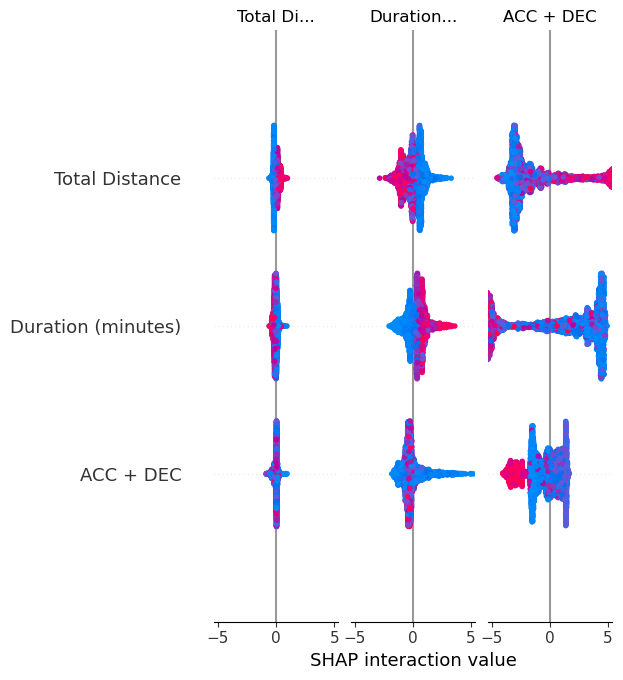

In [46]:
import shap

# Create SHAP explainer for the trained XGBoost model
explainer = shap.TreeExplainer(xgb_model)

# Get SHAP values for the test set
shap_values = explainer.shap_values(X_test_scaled)

# Get the feature names used in the model
feature_names = X.columns

# Summary plot (this will display all key features)
shap.summary_plot(shap_values, X_test_scaled, feature_names=feature_names)
